# Subpocket center robustness

We aim for robust subpocket centers, in order to calculate comparable subpocket distances across kinase structures.

- Mean/standard deviation for centers between and across subpockets
- Superimpose random structures with their subpocket centers

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import itertools
from pathlib import Path
import random

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from opencadd.databases.klifs import setup_remote
from opencadd.structure.pocket import PocketKlifs, PocketViewer

from kissim.definitions import ANCHOR_RESIDUES
from kissim.encoding import FingerprintGenerator

In [3]:
plt.style.use("seaborn")

In [4]:
HERE = Path(_dh[-1])  # noqa: F821
DATA = HERE / "../../data/"
RESULTS = HERE / "../../results/all"

In [5]:
REMOTE = setup_remote()

## Mean/standard deviation for centers between and across subpockets

### Load fingerprints

Let's load our pre-calculated fingerprint saved in a _json_ file as `FingerprintGenerator` object.

In [6]:
print(RESULTS / "fingerprints.json")

/home/dominique/Documents/GitHub/kissim_app/notebooks/003_subpockets/../../results/all/fingerprints.json


In [7]:
fingerprint_generator = FingerprintGenerator.from_json(
    RESULTS / "fingerprints.json", normalize=True
)
print(f"Number of fingerprints: {len(fingerprint_generator.data)}")

Number of fingerprints: 4623


In [8]:
fingerprint_generator.subpocket_centers

subpocket    center                       dfg_region                        \
dimension         x          y          z          x          y          z   
1          0.783500  22.267733  37.174877   7.576667  23.035334  34.537666   
2          1.191702  20.817879  37.386288   7.965667  20.143333  35.402332   
7          1.359035  20.156143  37.291439   7.822000  18.951666  34.895000   
8          1.112519  20.501137  37.463730   8.029333  19.181000  34.653332   
9          1.486894  20.644777  37.286716   8.830001  20.746332  33.714001   
...             ...        ...        ...        ...        ...        ...   
13714      1.543000  20.425470  36.839672   7.146000  19.728666  33.957333   
13721      1.532253  20.420856  36.825047   7.168334  19.666334  33.922337   
13724      1.546747  20.428072  36.788261   7.160667  19.735334  33.867001   
13735      1.539410  20.430508  36.803299   7.152000  19.726000  33.912998   
13740      1.299214  20.928894  36.245056   7.860000  20.729000  34.201668   

subpocket front_pocket                       hinge_region             \
dimension            x          y          z            x          y   
1             1.165333  17.645666  39.785000     1.416667  23.411001   
2             0.154000  16.202665  40.373333     1.687667  22.151001   
7            -0.570333  15.923000  40.285999     1.809667  21.452667   
8            -0.634000  15.860000  40.014668     1.757667  21.376665   
9            -0.528000  15.835332  40.904331     1.711667  21.714333   
...                ...        ...        ...          ...        ...   
13714        -0.467000  15.866666  39.992664     1.867333  21.556665   
13721        -0.539333  15.851001  40.006668     1.912333  21.511000   
13724        -0.438000  15.856000  40.012669     1.857333  21.549002   
13735        -0.456667  15.859000  40.011665     1.860000  21.551666   
13740         0.370667  16.046333  39.406334     1.981667  21.840332   

subpocket             
dimension          z  
1          41.720001  
2          42.194332  
7          42.513668  
8          42.456001  
9          42.461334  
...              ...  
13714      41.864670  
13721      41.871670  
13724      41.827667  
13735      41.841335  
13740      41.735668  

[4623 rows x 12 columns]

### Load KLIFS reference PDB IDs

Load KLIFS reference structures and add structure KLIFS IDs.

In [9]:
# Get KLIFS reference structures
klifs_reference_structures = pd.read_csv(
    DATA / "external/structures/klifs_reference_structures.csv", delimiter=";"
)
klifs_reference_structures["structure.pdb_id"] = klifs_reference_structures[
    "structure.pdb_id"
].apply(lambda x: x.lower())
# Get metadata for these reference structures from KLIFS remote
structures = REMOTE.structures.by_structure_pdb_id(
    klifs_reference_structures["structure.pdb_id"].to_list()
)
structures = structures[
    ["structure.klifs_id", "structure.pdb_id", "structure.chain", "structure.alternate_model"]
]
# Merge information
klifs_reference_structures = klifs_reference_structures.merge(
    structures, how="left", on=["structure.pdb_id", "structure.chain", "structure.alternate_model"]
)
klifs_reference_structures

,kinase.group,kinase.klifs_name,structure.pdb_id,structure.chain,structure.alternate_model,ligand.name,structure.klifs_id
0,AGC,ROCK1,3d9v,A,-,H-1152P,2696
1,AGC,AKT2,3d0e,A,-,GSK690693,1912
2,AGC,PDK1,1uu3,A,A,LY333531,3180
3,CAMK,LCK,1qpd,A,-,Staurosporine,2267
4,CAMK,PHKg2,2y7j,A,A,Sunitinib,1894
5,CAMK,DAPK1,1wvx,A,-,BDB402,5616
6,CK1,CK1g3,2izs,A,A,4-amino-2-((3-chlorophenyl)amino)-5-(4-fluorob...,2228
7,CK1,CK1g1,2cmw,A,A,2-(2-hydroxyethylamino)-6-(3-chloroanilino)-9-...,5567
8,CK1,CK1g3,2chl,A,A,"5-amino-N-(2,6-difluorophenyl)-3-((4-sulfamoyl...",2220
9,CMGC,GSK3B,3zrm,A,A,"7-(4-hydroxyphenyl)-2-(pyridin-4-yl)thieno[3,2...",751


Remove reference structures that are not part of our dataset.

In [10]:
klifs_reference_structures = klifs_reference_structures[
    klifs_reference_structures["structure.klifs_id"].isin(list(fingerprint_generator.data.keys()))
].reset_index()
klifs_reference_structures

,index,kinase.group,kinase.klifs_name,structure.pdb_id,structure.chain,structure.alternate_model,ligand.name,structure.klifs_id
0,1,AGC,AKT2,3d0e,A,-,GSK690693,1912
1,2,AGC,PDK1,1uu3,A,A,LY333531,3180
2,3,CAMK,LCK,1qpd,A,-,Staurosporine,2267
3,5,CAMK,DAPK1,1wvx,A,-,BDB402,5616
4,12,Other,TTK,3gfw,A,-,Mps1-IN-1,4714
5,13,Other,AurA,2xru,A,-,PHA-828300,1954
6,14,Other,Wee1,1x8b,A,-,PD0407824,209
7,15,STE,MST3,3a7i,A,-,Adenine,5611
8,16,STE,YSK1,2xik,A,A,(Z)-5-((5-chloro-2-oxoindolin-3-ylidene)methyl...,463
9,18,TK,SYK,3fqs,A,A,R406,1169


### Inter-subpocket distances within each structure

In [11]:
subpocket_centers = fingerprint_generator.subpocket_centers
subpocket_names = subpocket_centers.columns.get_level_values("subpocket").unique()
subpocket_pairs = itertools.combinations(subpocket_names, 2)
distances = {}
for subpocket_pair in subpocket_pairs:
    difference = subpocket_centers[subpocket_pair[0]] - subpocket_centers[subpocket_pair[1]]
    distance = difference.dropna().apply(lambda x: np.linalg.norm(x), axis=1)
    distances[subpocket_pair] = distance
distances = pd.DataFrame(distances)
distances

center                             dfg_region               \
      dfg_region front_pocket hinge_region front_pocket hinge_region   
1       7.327429     5.321845     4.729283     9.883736     9.469565   
2       7.090676     5.594592     5.014029    10.062895     9.464422   
7       6.997399     5.532572     5.399604    10.424344    10.022338   
8       7.581782     5.576537     5.109358    10.715704    10.248727   
9       8.166751     6.346471     5.288775    12.782447    11.319167   
...          ...          ...          ...          ...          ...   
13714   6.339324     5.896114     5.160949    10.454571     9.681523   
13721   6.384390     5.941192     5.176995    10.534894     9.706711   
13724   6.366298     5.936317     5.171901    10.514666     9.735859   
13735   6.352270     5.930988     5.171227    10.489959     9.705506   
13740   6.874540     5.890270     5.607431    10.252123     9.620344   

      front_pocket  
      hinge_region  
1         6.086583  
2         6.407095  
7         6.419044  
8         6.489513  
9         6.480973  
...            ...  
13714     6.428811  
13721     6.443950  
13724     6.401019  
13735     6.412572  
13740     6.449150  

[4623 rows x 6 columns]

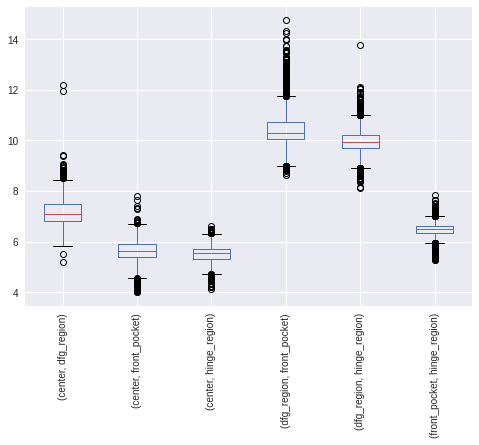

In [12]:
distances.plot(kind="box", rot=90);

In [13]:
distances_stats = pd.concat([distances.std(), distances.mean()], axis=1)
distances_stats.columns = ["std", "mean"]
distances_stats

std       mean
center       dfg_region    0.489560   7.144902
             front_pocket  0.442532   5.640262
             hinge_region  0.323701   5.504569
dfg_region   front_pocket  0.820630  10.533207
             hinge_region  0.552789  10.025431
front_pocket hinge_region  0.294756   6.447170

In [14]:
distances_stats = distances_stats.reset_index()

distances_stats_1 = distances_stats.copy()
distances_stats_1 = distances_stats_1.rename(
    columns={"level_0": "subpocket 1", "level_1": "subpocket 2"}
)
distances_stats_2 = distances_stats.copy()
distances_stats_2 = distances_stats_2.rename(
    columns={"level_1": "subpocket 1", "level_0": "subpocket 2"}
)

distances_stats = pd.concat([distances_stats_1, distances_stats_2])
distances_stats

,subpocket 1,subpocket 2,std,mean
0,center,dfg_region,0.489560,7.144902
1,center,front_pocket,0.442532,5.640262
2,center,hinge_region,0.323701,5.504569
3,dfg_region,front_pocket,0.820630,10.533207
4,dfg_region,hinge_region,0.552789,10.025431
5,front_pocket,hinge_region,0.294756,6.447170
0,dfg_region,center,0.489560,7.144902
1,front_pocket,center,0.442532,5.640262
2,hinge_region,center,0.323701,5.504569
3,front_pocket,dfg_region,0.820630,10.533207


### Intra-subpocket distances to reference structure

In [15]:
subpocket_centers = fingerprint_generator.subpocket_centers
subpocket_names = subpocket_centers.columns.get_level_values("subpocket").unique()
structure_klifs_ids = klifs_reference_structures["structure.klifs_id"].to_list()

distances = {}

for subpocket_name in subpocket_names:
    distances[subpocket_name] = {}
    for structure_klifs_id in structure_klifs_ids:
        a = subpocket_centers[subpocket_name].drop(structure_klifs_id)
        b = subpocket_centers[subpocket_name].loc[structure_klifs_id, :]
        difference = a - b
        distance = difference.dropna().apply(lambda x: np.linalg.norm(x), axis=1)
        distances[subpocket_name][structure_klifs_id] = distance
    distances[subpocket_name] = pd.DataFrame(distances[subpocket_name])

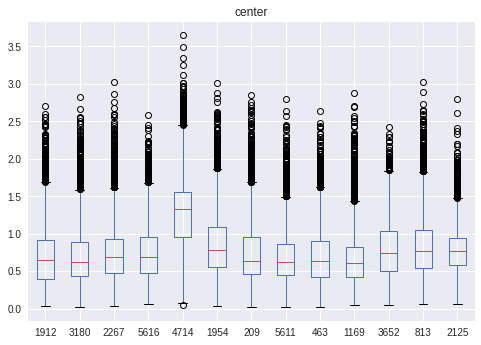

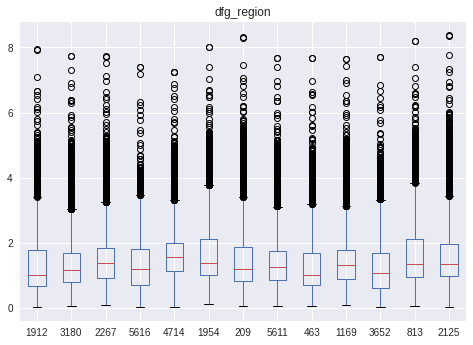

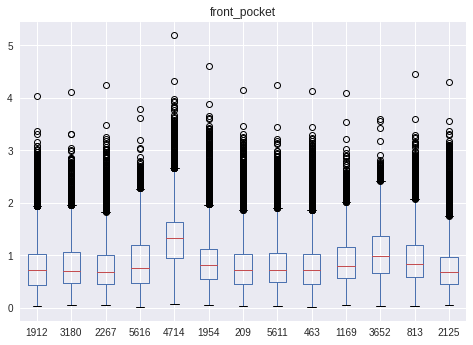

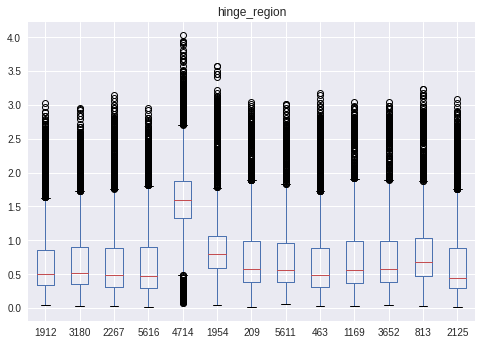

In [16]:
for subpocket_name in subpocket_names:
    distances[subpocket_name].plot(kind="box", title=subpocket_name)

In [17]:
# Get mean of each reference structure's std
distances_stats_intra = []
for subpocket_name in subpocket_names:
    distance_std = distances[subpocket_name].std().mean()
    distance_mean = distances[subpocket_name].mean().mean()
    distances_stats_intra.append([subpocket_name, subpocket_name, distance_std, distance_mean])
distances_stats_intra = pd.DataFrame(
    distances_stats_intra, columns=["subpocket 1", "subpocket 2", "std", "mean"]
)

### Heatmap for inter- and intra-subpocket distances (mean/std)

In [18]:
distances_stats = pd.concat([distances_stats, distances_stats_intra]).reset_index(drop=True)
distances_stats

,subpocket 1,subpocket 2,std,mean
0,center,dfg_region,0.489560,7.144902
1,center,front_pocket,0.442532,5.640262
2,center,hinge_region,0.323701,5.504569
3,dfg_region,front_pocket,0.820630,10.533207
4,dfg_region,hinge_region,0.552789,10.025431
5,front_pocket,hinge_region,0.294756,6.447170
6,dfg_region,center,0.489560,7.144902
7,front_pocket,center,0.442532,5.640262
8,hinge_region,center,0.323701,5.504569
9,front_pocket,dfg_region,0.820630,10.533207


In [19]:
distances_std_pivot = distances_stats.drop("mean", axis=1).pivot(
    columns="subpocket 1", index="subpocket 2", values="std"
)
distances_std_pivot

subpocket 1,center,dfg_region,front_pocket,hinge_region
subpocket 2,,,,
center,0.388666,0.489560,0.442532,0.323701
dfg_region,0.489560,0.987228,0.820630,0.552789
front_pocket,0.442532,0.820630,0.549848,0.294756
hinge_region,0.323701,0.552789,0.294756,0.566959


In [20]:
distances_mean_pivot = distances_stats.drop("std", axis=1).pivot(
    columns="subpocket 1", index="subpocket 2", values="mean"
)
# Reverse column names to that they overlay with the heatmap
reversed_column_names = distances_mean_pivot.columns.to_list()[::-1]
distances_mean_pivot = distances_mean_pivot.loc[reversed_column_names, reversed_column_names]
distances_mean_pivot

subpocket 1,hinge_region,front_pocket,dfg_region,center
subpocket 2,,,,
hinge_region,0.820086,6.447170,10.025431,5.504569
front_pocket,6.447170,0.926636,10.533207,5.640262
dfg_region,10.025431,10.533207,1.510049,7.144902
center,5.504569,5.640262,7.144902,0.785892


Text(51.0, 0.5, '')

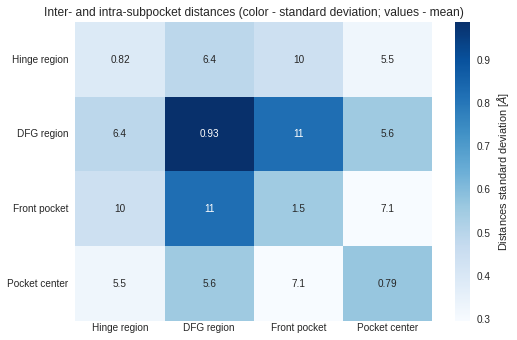

In [21]:
sns.heatmap(
    distances_std_pivot,
    cmap="Blues",
    annot=distances_mean_pivot,
    cbar_kws={"label": "Distances standard deviation [$\AA$]"},  # noqa: W605
)
labels = ["Hinge region", "DFG region", "Front pocket", "Pocket center"]
plt.title("Inter- and intra-subpocket distances (color - standard deviation; values - mean)")
plt.xticks(np.arange(4) + 0.5, (labels), rotation=0, va="center")
plt.yticks(np.arange(4) + 0.5, (labels), rotation=0, va="center")
plt.xlabel("")
plt.ylabel("")
# sns.set(font_scale=2)

Key takeaways:

- Distance mean
  - Pocket center, hinge region, and front pocket are about equally spaced from each other (~6A)
  - DFG region is a bit further away (closer to pocket center than to hinge region and front pocket)
- Distance standard deviation
  - Standard deviations are all below 1A
  - DFG subpocket shows most variation (w.r.t. DFG conformations), followed by the front pocket (w.r.t. flexible p-loop)


### Show example structure with subpockets

Let's show an example structure with subpockets to make sense of the mean distances that we have calculated.

In [22]:
subpockets = {
    "anchor_residue.klifs_ids": list(ANCHOR_RESIDUES.values()),
    "subpocket.name": list(ANCHOR_RESIDUES.keys()),
    "subpocket.color": ["magenta", "cyan", "green"],
}
subpockets

{'anchor_residue.klifs_ids': [[16, 47, 80], [19, 24, 81], [10, 48, 72]],
 'subpocket.name': ['hinge_region', 'dfg_region', 'front_pocket'],
 'subpocket.color': ['magenta', 'cyan', 'green']}

In [26]:
pocket = PocketKlifs.from_structure_klifs_id(3652, subpockets)

In [24]:
subpocket_coords = (
    pocket.subpockets[["subpocket.name", "subpocket.center"]].set_index("subpocket.name").squeeze()
)
subpocket_coords = pd.concat(
    [subpocket_coords, pd.Series([pocket.center.tolist()], index=["center"])]
)

distances_example_structure = {}
subpocket_pairs = itertools.combinations(subpocket_coords.index, 2)
for subpocket_pair in subpocket_pairs:
    difference = subpocket_coords[subpocket_pair[0]] - subpocket_coords[subpocket_pair[1]]
    distance = np.linalg.norm(difference)
    distances_example_structure[subpocket_pair] = distance
distances_example_structure

{('hinge_region', 'dfg_region'): 9.955494,
 ('hinge_region', 'front_pocket'): 6.3870726,
 ('hinge_region', 'center'): 5.538795222621422,
 ('dfg_region', 'front_pocket'): 10.053213,
 ('dfg_region', 'center'): 7.183169918155383,
 ('front_pocket', 'center'): 5.249160890296896}

In [25]:
viewer = PocketViewer()
viewer.add_pocket(pocket)
viewer.viewer

NGLWidget()

In [27]:
viewer.viewer.render_image(trim=True, factor=1, transparent=True);

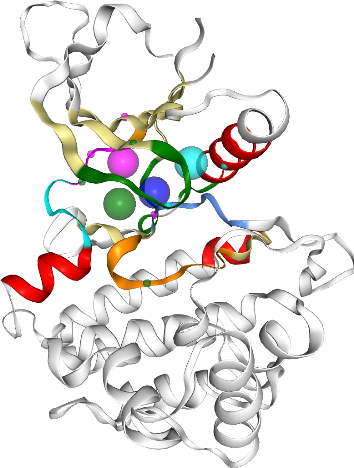

In [28]:
viewer.viewer._display_image()

## Superimpose random structures with their subpocket centers

In [29]:
N_RANDOM_STRUCTURES = 20

In [30]:
SUBPOCKETS = {
    "anchor_residue.klifs_ids": list(ANCHOR_RESIDUES.values()),
    "subpocket.name": list(ANCHOR_RESIDUES.keys()),
    "subpocket.color": ["magenta", "cyan", "green"],
}
SUBPOCKETS

{'anchor_residue.klifs_ids': [[16, 47, 80], [19, 24, 81], [10, 48, 72]],
 'subpocket.name': ['hinge_region', 'dfg_region', 'front_pocket'],
 'subpocket.color': ['magenta', 'cyan', 'green']}

In [31]:
structure_klifs_ids = list(fingerprint_generator.data.keys())
structure_klifs_ids_random = random.sample(structure_klifs_ids, N_RANDOM_STRUCTURES)

In [32]:
print(*structure_klifs_ids_random)

3344 4240 12935 932 3060 4725 5131 13644 1646 6835 8067 5603 3597 12399 9278 3962 995 11959 2652 1883


In [34]:
viewer = PocketViewer()
for structure_klifs_id in structure_klifs_ids_random:
    pocket = PocketKlifs.from_structure_klifs_id(structure_klifs_id, SUBPOCKETS)
    viewer.add_pocket(pocket, show_only_pocket_residues=True)
viewer.viewer #.display(gui=True)

NGLWidget()

In [35]:
viewer.viewer.render_image(trim=True, factor=1, transparent=True);

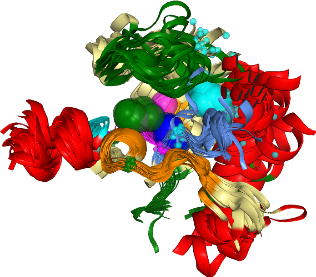

In [36]:
viewer.viewer._display_image()

In [37]:
viewer = PocketViewer()
for structure_klifs_id in structure_klifs_ids_random:

    pocket = PocketKlifs.from_structure_klifs_id(structure_klifs_id, SUBPOCKETS)

    viewer.add_pocket(pocket, show_only_pocket_residues=True)
    component_ix = viewer._components_structures[structure_klifs_id]
    selection = " or ".join(viewer.pockets_residue_ngl_ixs[pocket.name])

    viewer.viewer.clear_representations(component_ix)
    viewer.viewer.add_representation(
        "cartoon", selection=selection, component=component_ix, opacity=0.1
    )
viewer.viewer.display(gui=True)

NGLWidget(gui_style='ngl')

In [38]:
viewer.viewer.render_image(trim=True, factor=1, transparent=True);

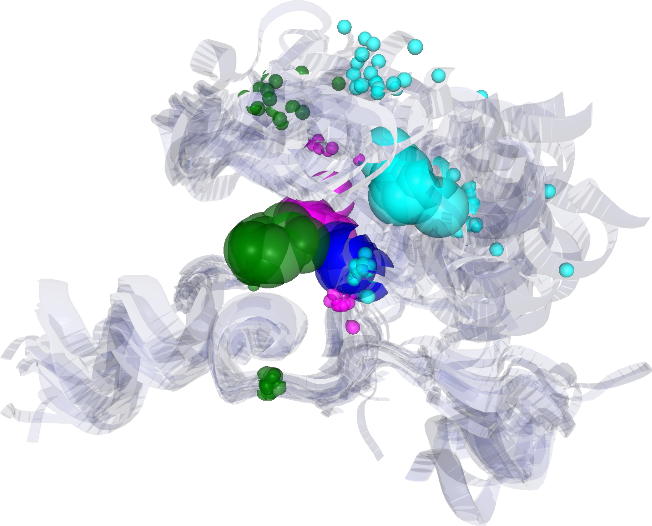

In [39]:
viewer.viewer._display_image()